In [ ]:
# Add the repo root to the sys path for the model import below
import sys

sys.path.append("../..")

: 

In [2]:
import sys
print(sys.path)


['/workspace', '/opt/conda/envs/claymodel/lib/python311.zip', '/opt/conda/envs/claymodel/lib/python3.11', '/opt/conda/envs/claymodel/lib/python3.11/lib-dynload', '', '/opt/conda/envs/claymodel/lib/python3.11/site-packages', '../..']


In [ ]:

import math
import geopandas as gpd
import numpy as np
import pandas as pd
import pystac_client
import stackstac
import yaml
from box import Box
from matplotlib import pyplot as plt
from rasterio.enums import Resampling
from shapely import Point
from sklearn import decomposition, svm


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 12.6 MB/s  0:00:00 eta 0:00:01
Note: you may need to restart the kernel to use updated packages.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 23.2 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 561.5/561.5 kB 11.2 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 25.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 25.6 MB/s  0:00:00 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5/5 [timm]4/5 [timm]vision]hub]
Note: you may need to restart the kernel to use updated packages.


/opt/conda/envs/claymodel/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
# Point over my college
lat, lon = 17.54389, 78.57528

# recent dates
start = "2024-08-05"
end = "2025-08-05"

In [6]:
STAC_API = "https://earth-search.aws.element84.com/v1"
COLLECTION = "sentinel-2-l2a"

# Search the catalogue
catalog = pystac_client.Client.open(STAC_API)
search = catalog.search(
    collections=[COLLECTION],
    datetime=f"{start}/{end}",
    bbox=(lon - 1e-5, lat - 1e-5, lon + 1e-5, lat + 1e-5),
    max_items=100,
    query={"eo:cloud_cover": {"lt": 80}},
)

all_items = search.get_all_items()

# Reduce to one per date (there might be some duplicates
# based on the location)
items = []
dates = []
for item in all_items:
    if item.datetime.date() not in dates:
        items.append(item)
        dates.append(item.datetime.date())

print(f"Found {len(items)} items")

/opt/conda/envs/claymodel/lib/python3.11/site-packages/pystac_client/item_search.py:940: FutureWarning: get_all_items() is deprecated, use item_collection() instead.
  warnings.warn(


Found 52 items


In [7]:
print(items[0].properties.keys())


dict_keys(['created', 'platform', 'constellation', 'instruments', 'eo:cloud_cover', 'proj:centroid', 'mgrs:utm_zone', 'mgrs:latitude_band', 'mgrs:grid_square', 'grid:code', 'view:azimuth', 'view:incidence_angle', 'view:sun_azimuth', 'view:sun_elevation', 's2:tile_id', 's2:degraded_msi_data_percentage', 's2:nodata_pixel_percentage', 's2:saturated_defective_pixel_percentage', 's2:cloud_shadow_percentage', 's2:vegetation_percentage', 's2:not_vegetated_percentage', 's2:water_percentage', 's2:unclassified_percentage', 's2:medium_proba_clouds_percentage', 's2:high_proba_clouds_percentage', 's2:thin_cirrus_percentage', 's2:snow_ice_percentage', 's2:product_type', 's2:processing_baseline', 's2:product_uri', 's2:generation_time', 's2:datatake_id', 's2:datatake_type', 's2:datastrip_id', 's2:reflectance_conversion_factor', 'datetime', 's2:sequence', 'earthsearch:s3_path', 'earthsearch:payload_id', 'earthsearch:boa_offset_applied', 'processing:software', 'updated', 'proj:code'])


In [8]:
import pyproj
pyproj.datadir.set_data_dir("/home/yash/miniconda3/envs/claymodel/share/proj")#THIS IS THE PATH TO YOUR PROJ DATA DIRECTORY, RESOLVES A COMMON ERROR WHEN USING PROJ LIBRARY

from pyproj import CRS
print(CRS.from_epsg(4326))


EPSG:4326


In [9]:
# Extract coordinate system from first item
epsg = items[0].properties["proj:code"]
print(f"Using EPSG code: {epsg}")

# Convert point of interest into the image projection
# (assumes all images are in the same projection)
poidf = gpd.GeoDataFrame(
    pd.DataFrame(),
    crs="EPSG:4326",
    geometry=[Point(lon, lat)],
).to_crs(epsg)

coords = poidf.iloc[0].geometry.coords[0]

# Create bounds in projection
size = 256
gsd = 10
bounds = (
    coords[0] - (size * gsd) // 2,
    coords[1] - (size * gsd) // 2,
    coords[0] + (size * gsd) // 2,
    coords[1] + (size * gsd) // 2,
)

Using EPSG code: EPSG:32644


In [10]:
# Retrieve the pixel values, for the bounding box in
# the target projection. In this example we use only
# the RGB and NIR bands.
epsg = items[0].properties["proj:code"].split(":")[-1]
stack = stackstac.stack(
    items,
    bounds=bounds,
    snap_bounds=False,
    epsg=int(epsg),
    resolution=gsd,
    dtype="float64",#this has been changed from "float32" to "float64" to avoid overflow issues
    rescale=False,
    fill_value=0.0,#and this from 0 to 0.0 to avoid overflow issues
    assets=["blue", "green", "red", "nir"],
    resampling=Resampling.nearest,
)

print(stack)

stack = stack.compute()

<xarray.DataArray 'stackstac-70b8b81893e6b52864c43624a94be170' (time: 52,
                                                                band: 4,
                                                                y: 256, x: 256)> Size: 109MB
dask.array<fetch_raster_window, shape=(52, 4, 256, 256), dtype=float64, chunksize=(1, 1, 256, 256), chunktype=numpy.ndarray>
Coordinates: (12/51)
  * time                                     (time) datetime64[ns] 416B 2024-...
    id                                       (time) <U24 5kB 'S2B_43QHV_20240...
  * band                                     (band) <U5 80B 'blue' ... 'nir'
  * x                                        (x) float64 2kB 2.413e+05 ... 2....
  * y                                        (y) float64 2kB 1.943e+06 ... 1....
    s2:generation_time                       (time) <U27 6kB '2024-09-29T08:3...
    ...                                       ...
    s2:tile_id                               (time) object 416B None ... 'S2C...
 

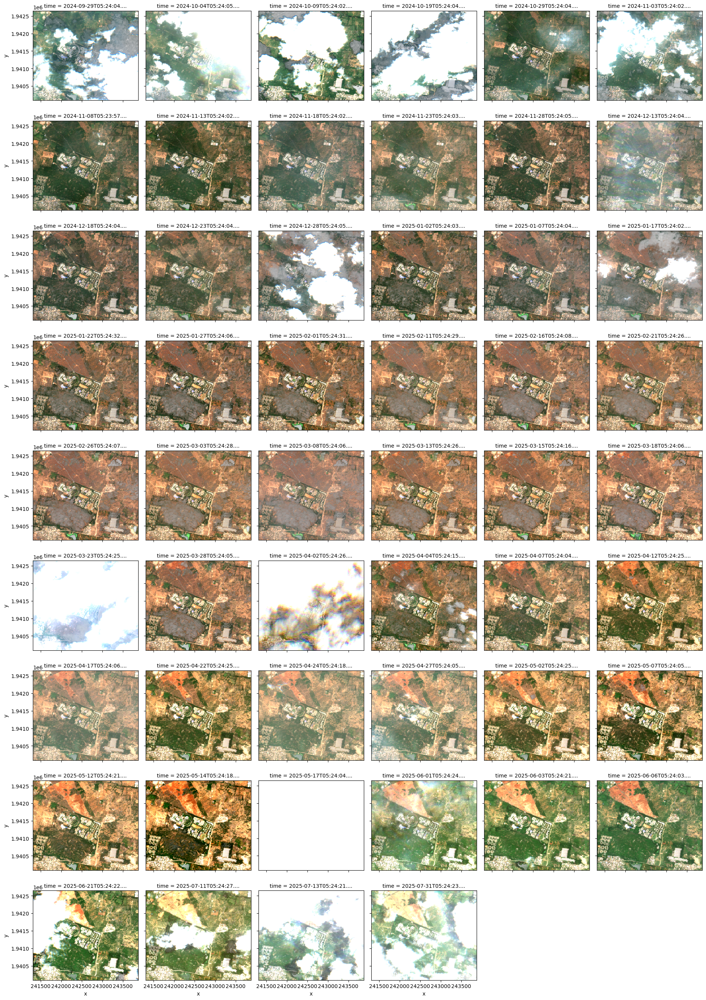

In [11]:
stack.sel(band=["red", "green", "blue","nir"]).plot.imshow(
    row="time", rgb="band", vmin=0, vmax=2000, col_wrap=6
)

In [ ]:
import os
from matplotlib import pyplot as plt

# Ensure outputs folder exists
os.makedirs("processed_images", exist_ok=True)

# Loop over each time step and save the image
for i, time_val in enumerate(stack.time.values):
    # Extract the red, green, blue bands for that time
    rgb = stack.sel(time=time_val, band=["red", "green", "blue"]).values

    # Rearrange from (bands, height, width) -> (height, width, bands)
    rgb = np.transpose(rgb, (1, 2, 0))

    # Clip and normalize to 0–1 for saving
    rgb = np.clip(rgb / 2000.0, 0, 1)

    # Format time for filename
    time_str = np.datetime_as_string(time_val, unit='D')

    # Save image
    plt.imsave(f"processed_images/{time_str}.png", rgb)

print(f"Saved {len(stack.time)} images to 'processed_images/'")
